# Penalty Comparison: fidelity vs sensitivity as a function of λ (sensitivity weight)

This notebook compares the effectiveness of the toggling-frame robustness objective for both multiplicative and additive errors. It's strucuted as follows:
* Imports
* Problem Setups: Here we compare the effect of the toggling frame robustness objective on additive and multiplicative errors without any variational states.
    * Base case: unitary smooth pulse problem w/o any robustness or sentivity objectives
    * Toggle Robustness: Optimize pulses for toggle-frame robustness
* Plot Fidelity vs. Error
* Plot Trajectories and Control pulses
* Pareto Frontiers of Fidelity vs. Robustness Penality

## Imports

In [2]:
import Pkg; Pkg.activate(@__DIR__); Pkg.instantiate();
Pkg.develop(path="../../QuantumCollocation.jl")
using PiccoloQuantumObjects
using QuantumCollocation
using ForwardDiff
using LinearAlgebra
using Plots
using SparseArrays
using Statistics
using CairoMakie
using NamedTrajectories
using TrajectoryIndexingUtils
using Random
using Measures: mm

  Activating project at `~/Documents/research/pulses/project/notebooks/src`
┌ Warning: Circular dependency detected.
│ Precompilation will be skipped for dependencies in this cycle:
│  ┌ Piccolissimo
│  └─ QuantumCollocation
└ @ Base.Precompilation precompilation.jl:651
   Resolving package versions...
  No Changes to `~/Documents/research/pulses/project/notebooks/src/Project.toml`
  No Changes to `~/Documents/research/pulses/project/notebooks/src/Manifest.toml`


## Problem Setups
Here, we first setup the quantum systems and solve for optimal pulses. There is the default smooth unitary pulse case and the toggle-fram robustness subject to three error models (additive error, mujltiplcative error, both).

#### Preliminary Variables

In [2]:
# Problem parameters
T = 30
Δt = 0.2
U_goal = GATES.X
H_drive = [PAULIS.X, PAULIS.Y]
rob_scale = 1 / 8.0
piccolo_opts = PiccoloOptions(verbose=false)
da_bound=Inf
sys = QuantumSystem(H_drive)



QuantumSystem: levels = 2, n_drives = 2

Toggle setup

In [3]:
n_drives = sys.n_drives
n_guesses = 10
a_guess = [randn(2, T) for _ in 1:n_guesses]
a_bounds = fill(1/Δt, n_drives)
da_bounds = fill(1.0, n_drives)
dda_bounds = fill(1.0, n_drives)
control_bounds = (a_bounds, da_bounds, dda_bounds)
def_seeds = []
add_seeds = []
mult_seeds = []
both_seeds = []


for i in 1:n_guesses
    def_traj = initialize_trajectory(
                    U_goal,
                    T,
                    Δt,
                    n_drives,
                    control_bounds;
                    a_guess=deepcopy(a_guess[i]),
                    system=sys
                )
    push!(def_seeds, def_traj)

    add_traj = initialize_trajectory(
                    U_goal,
                    T,
                    Δt,
                    n_drives,
                    control_bounds;
                    a_guess=deepcopy(a_guess[i]),
                    system=sys
                )

    push!(add_seeds, add_traj)

    mult_traj = initialize_trajectory(
                U_goal,
                T,
                Δt,
                n_drives,
                control_bounds;
                a_guess=deepcopy(a_guess[i]),
                system=sys
            )

    push!(mult_seeds, mult_traj)

    both_traj = initialize_trajectory(
                U_goal,
                T,
                Δt,
                n_drives,
                control_bounds;
                a_guess=deepcopy(a_guess[i]),
                system=sys
            )
            
    push!(both_seeds, both_traj)
end

Run all seeds for various weights (lambdas) using the toggle objective on only the additive error problem

In [4]:
sweep_rob_loss_λ = [λ for λ in 0.0:5:100.0]
n_seeds = n_guesses
n_lambdas = length(sweep_rob_loss_λ)
add_probs = Matrix{Any}(undef, n_seeds, n_lambdas)
Hₑ_add = a -> PAULIS.X

for i in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        
        # Add problem
        add_prob = UnitarySmoothPulseProblem(
            sys, U_goal, T, Δt;
            init_trajectory=deepcopy(add_seeds[i]),
            piccolo_options=piccolo_opts,
            activate_rob_loss=true,
            H_err=Hₑ_add,
            Q_t=λ
        )
        solve!(add_prob; max_iter=250, print_level=5)
        add_probs[i, λ_idx] = add_prob
    end
end

    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applying constraint: bounds on Δt

******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.17, running with linear solver MUMPS 5.8.0.

Number of nonzeros in equality constraint Jacobian...:     2082
Number of nonzeros in inequality constraint Jacobian.:        0
Number of no

Plot the corresponding fidelity as a function of epsilon (error magnitude)

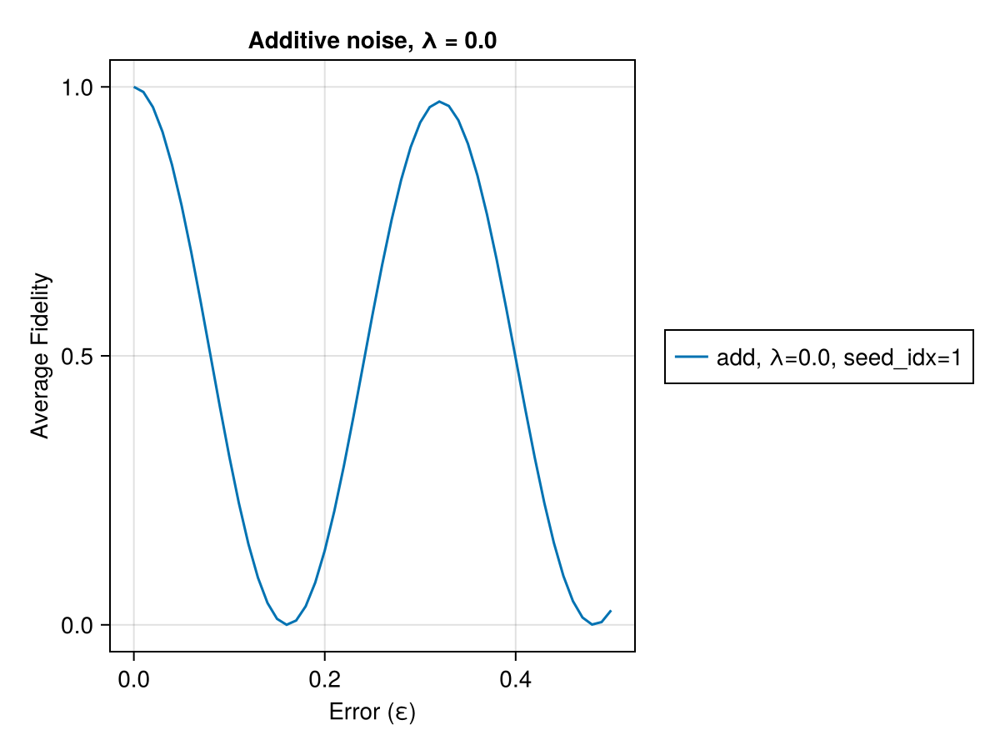


Processing λ = 0.0

Processing λ = 5.0

Processing λ = 10.0

Processing λ = 15.0

Processing λ = 20.0

Processing λ = 25.0

Processing λ = 30.0

Processing λ = 35.0

Processing λ = 40.0

Processing λ = 45.0

Processing λ = 50.0

Processing λ = 55.0

Processing λ = 60.0

Processing λ = 65.0

Processing λ = 70.0

Processing λ = 75.0

Processing λ = 80.0

Processing λ = 85.0

Processing λ = 90.0

Processing λ = 95.0

Processing λ = 100.0


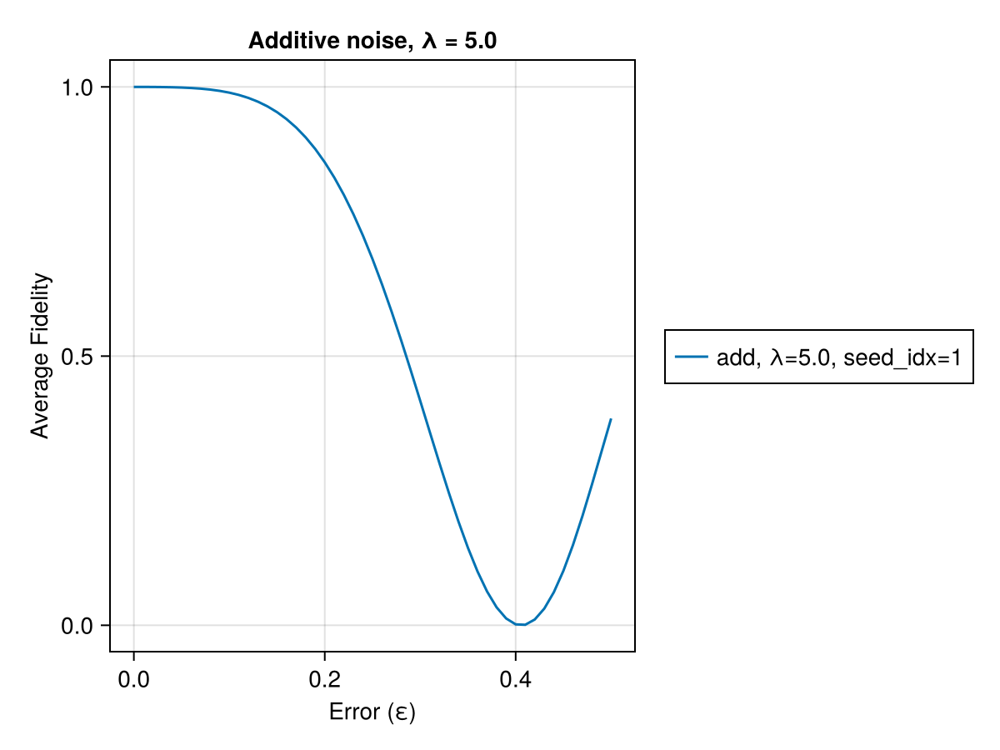

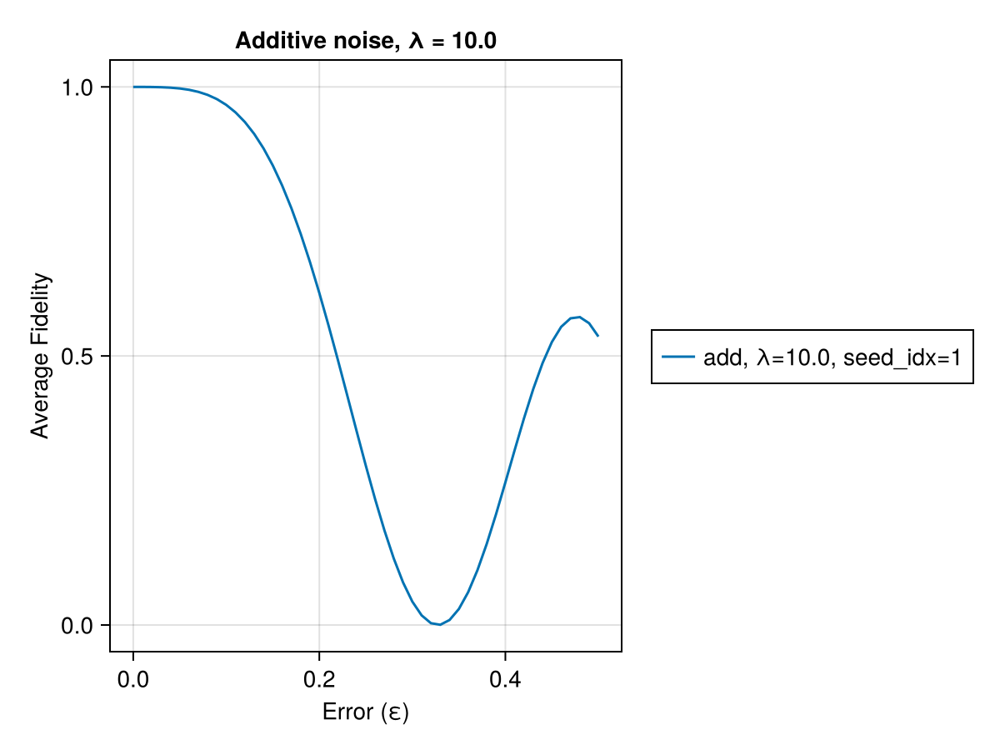

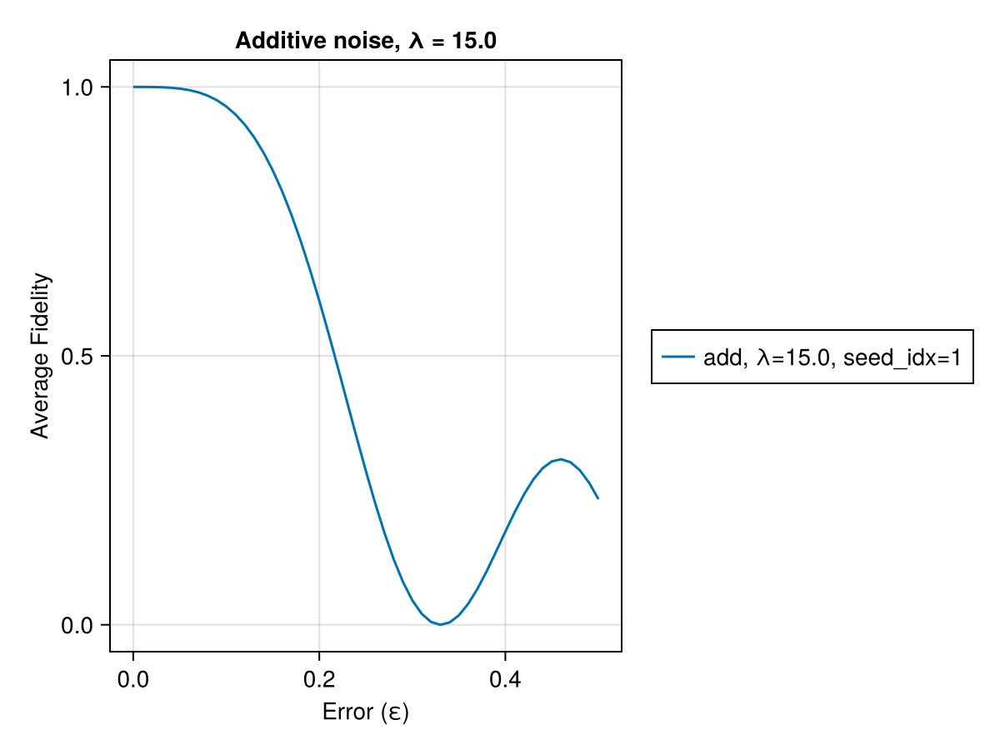

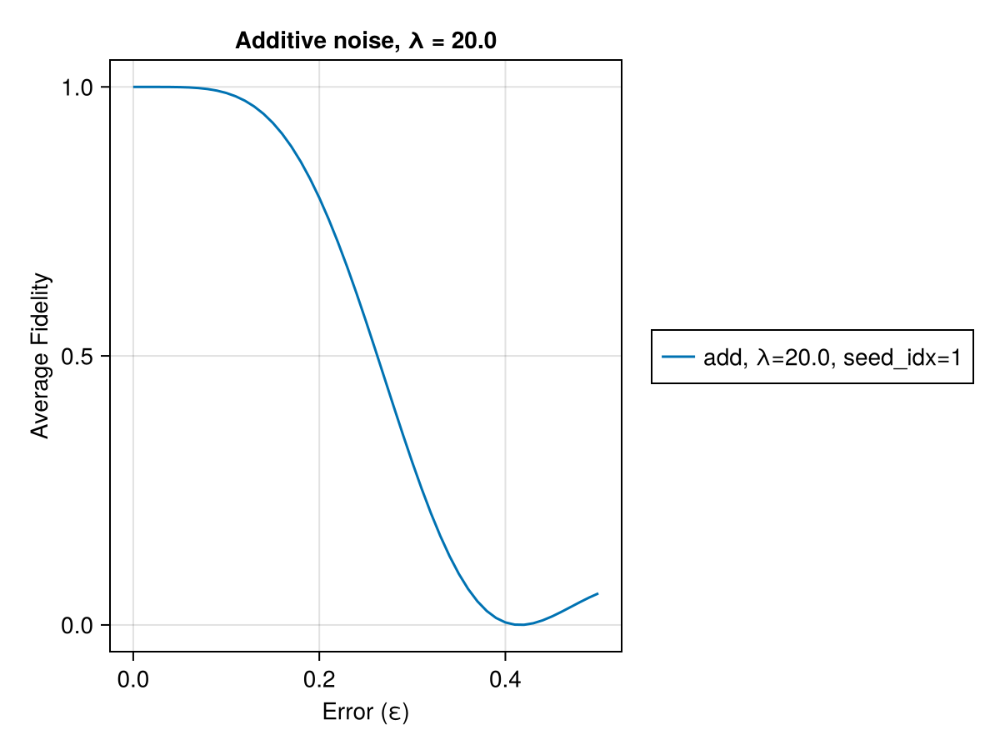

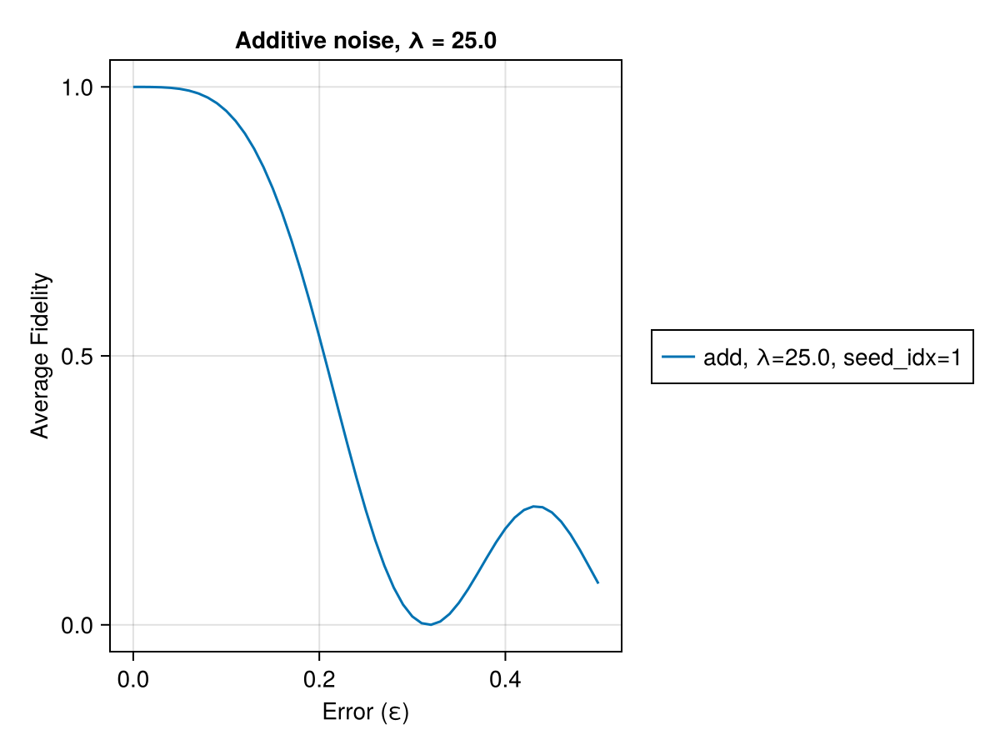

...

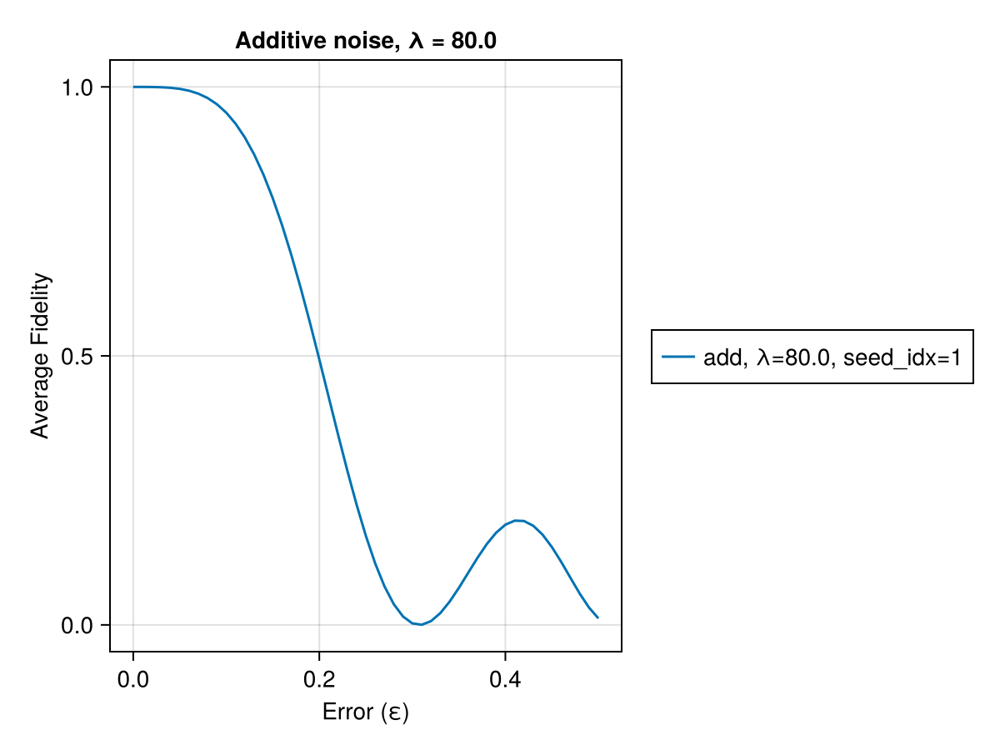

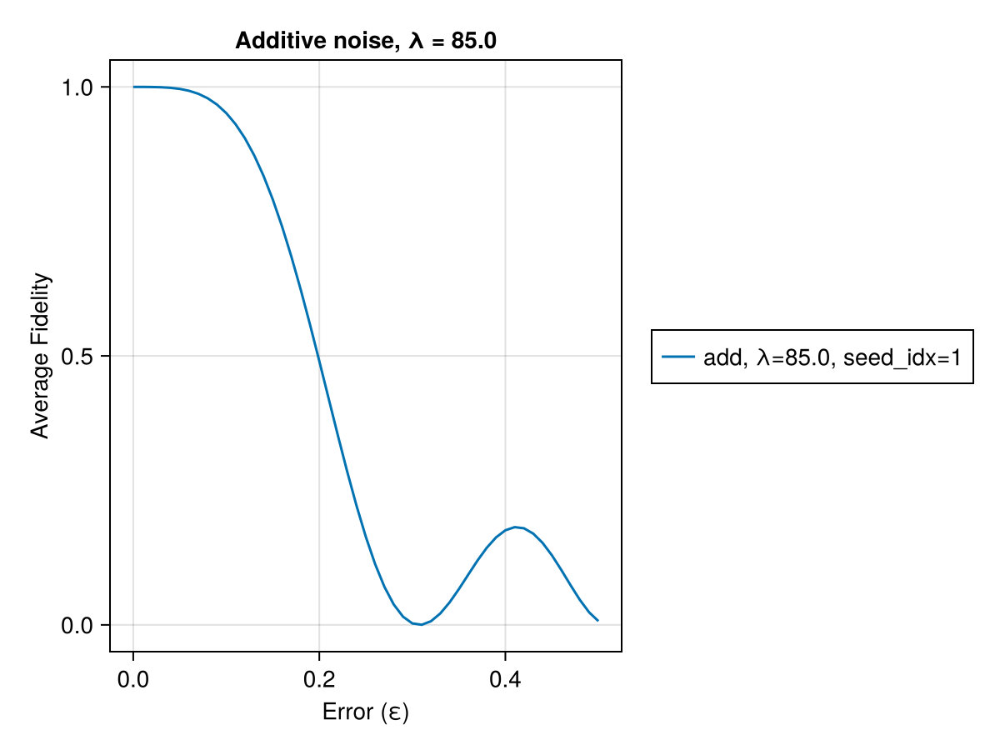

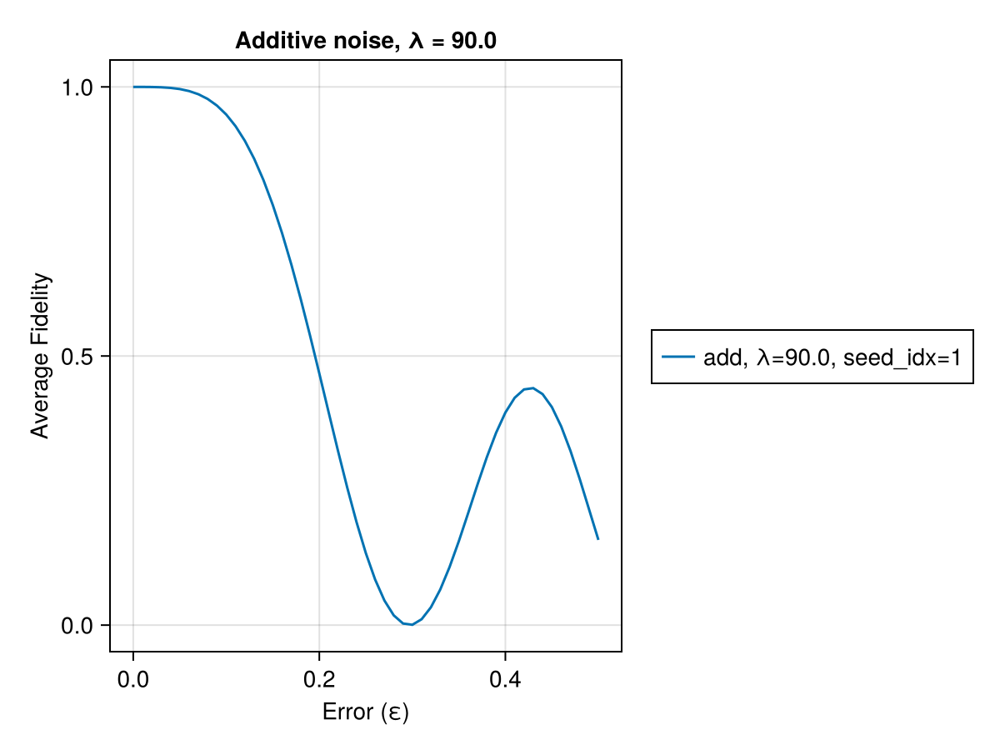

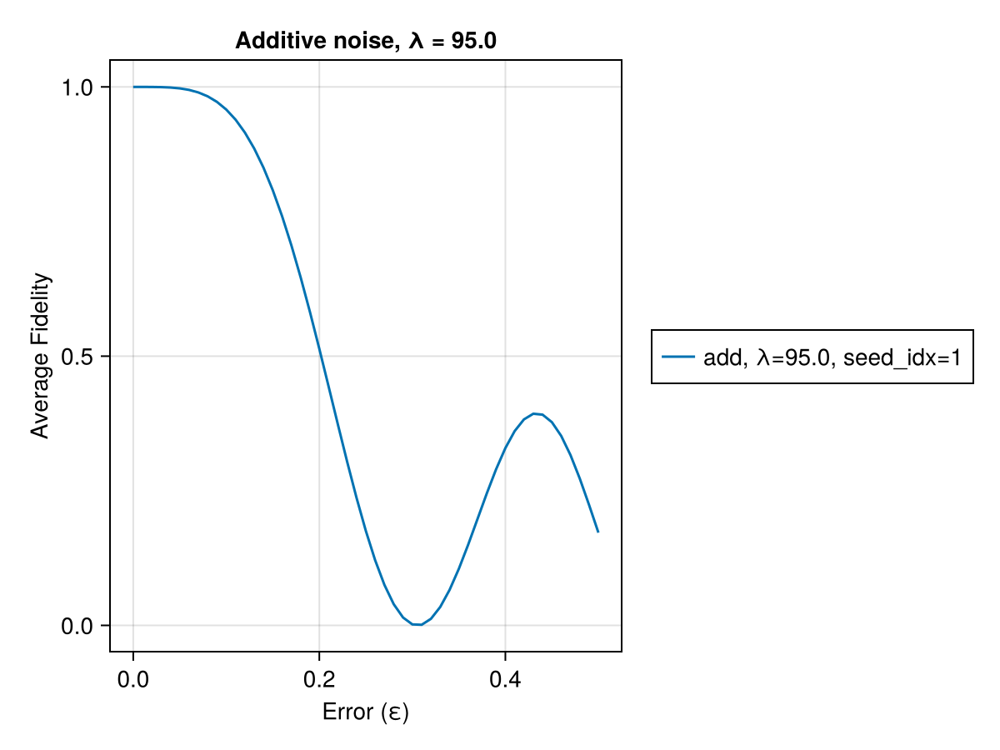

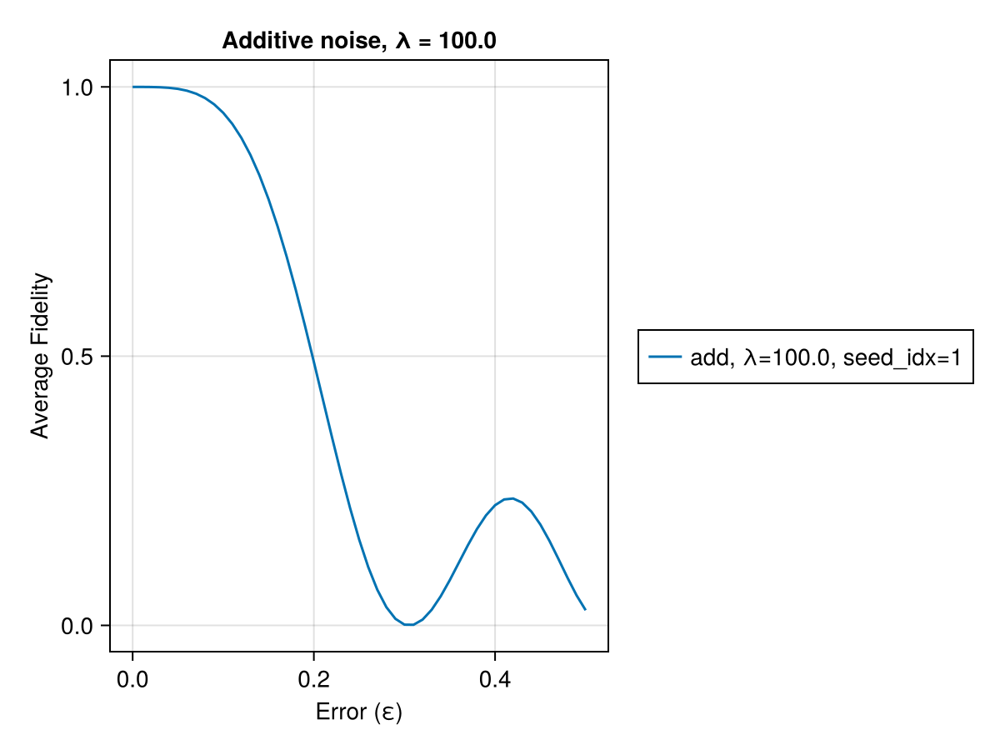

In [5]:
H_drive_add = H_drive
εs = 0:0.01:0.5
colors = Makie.wong_colors()

for seed_idx in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        println("\nProcessing λ = $λ")
        f = Figure()
        ax1 = Axis(f[1, 1], title="Additive noise, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")

        # Define system functions for additive and multiplicative noise
        additive_system = ε -> QuantumSystem(ε * PAULIS.X, H_drive)
        multiplicative_system = ε -> QuantumSystem((1 + ε) * H_drive)

        # Plot for both noise types
        # Additive noise
        ys_add = [unitary_rollout_fidelity(add_probs[seed_idx, λ_idx].trajectory, additive_system(ε)) for ε in εs]
        lines!(ax1, εs, ys_add, label="add, λ=$λ, seed_idx=$seed_idx", color=colors[1], linestyle=:solid)

        # Add legends
        Legend(f[1, 2], ax1, position=:lb)
        
        display(f)
    end
end


setup the same problems for the default, multiplcative, both error cases

In [6]:
default_probs = Matrix{Any}(undef, n_seeds, n_lambdas)

for i in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        defaults = UnitarySmoothPulseProblem(sys, U_goal, T, Δt; init_trajectory=deepcopy(def_seeds[i]))
        solve!(defaults; max_iter=250, print_level=5)
        default_probs[i,λ_idx] = defaults
    end
end

    constructing UnitarySmoothPulseProblem...
	using integrator: typeof(UnitaryIntegrator)
	applying timesteps_all_equal constraint: Δt
    initializing optimizer...
        applying constraint: timesteps all equal constraint
        applying constraint: initial value of Ũ⃗
        applying constraint: initial value of a
        applying constraint: final value of a
        applying constraint: bounds on a
        applying constraint: bounds on da
        applying constraint: bounds on dda
        applying constraint: bounds on Δt
This is Ipopt version 3.14.17, running with linear solver MUMPS 5.8.0.

Number of nonzeros in equality constraint Jacobian...:     2082
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:     1089

Total number of variables............................:      288
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      136
      

Excessive output truncated after 524328 bytes.

  15  1.4330085e-01 2.84e-03 2.00e+02  -1.0 1.08e-01   0.7 8.98e-01 1.00e+00f  1
  16  9.4843295e-02 3.78e-05 2.10e+00  -1.0 9.97e-03   2.1 1.00e+00 1.00e+00h  1


In [7]:
X_drive = sys.H.H_drives[1]
Hₑ_mult = a -> a[1] * X_drive
mult_probs = Matrix{Any}(undef, n_seeds, n_lambdas)
for i in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        # Mult problem
        mult_prob = UnitarySmoothPulseProblem(
            sys, U_goal, T, Δt;
            init_trajectory=deepcopy(mult_seeds[i]),
            piccolo_options=piccolo_opts,
            activate_rob_loss=true,
            H_err=Hₑ_mult,
            Q_t=λ
        )
        solve!(mult_prob; max_iter=250, print_level=5)
        mult_probs[i, λ_idx] = mult_prob
    end
end

In [8]:
# both_probs = Matrix{Any}(undef, n_seeds, n_lambdas)

# # Optimization loop with index counter
# for i in 1:n_seeds
#     for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        
#         # Both problem
#         both_prob = UnitaryVariationalProblem(
#             varsys_both, U_goal, T, Δt;
#             init_trajectory=deepcopy(varsys_both_seeds[i]),
#             variational_scales=[rob_scale,rob_scale],
#             sensitive_times=[[T]],
#             piccolo_options=piccolo_opts,
#             Q_s=λ
#         )
#         solve!(both_prob; max_iter=200, print_level=5)
#         both_probs[i, λ_idx] = both_prob
#     end
# end

plot fid v err magnitude for the above problems

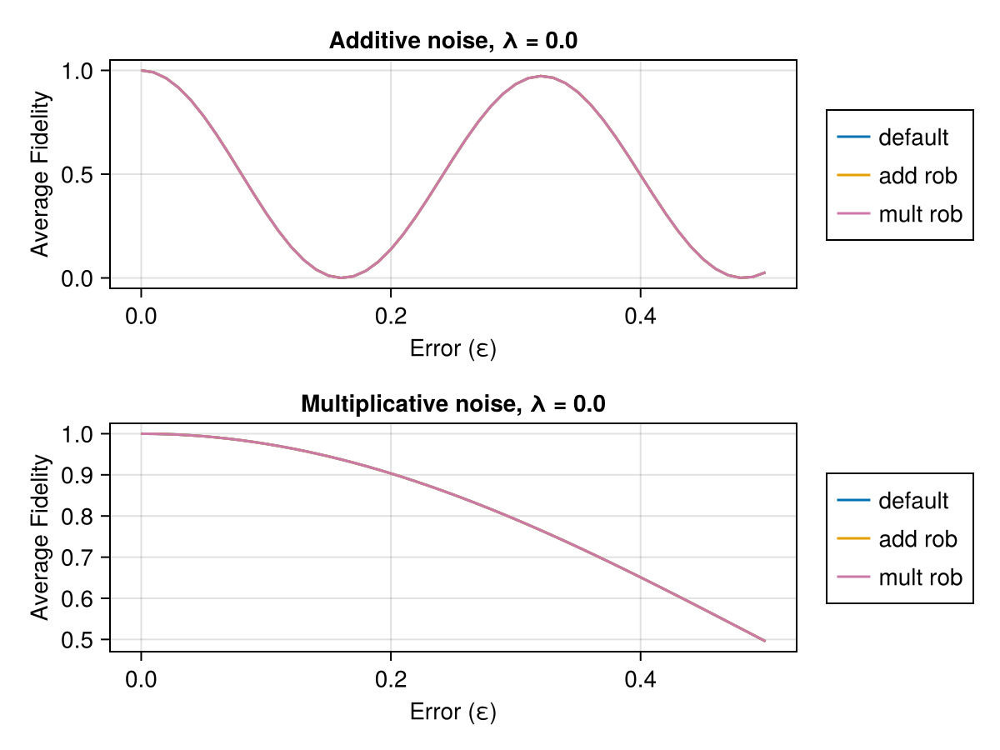

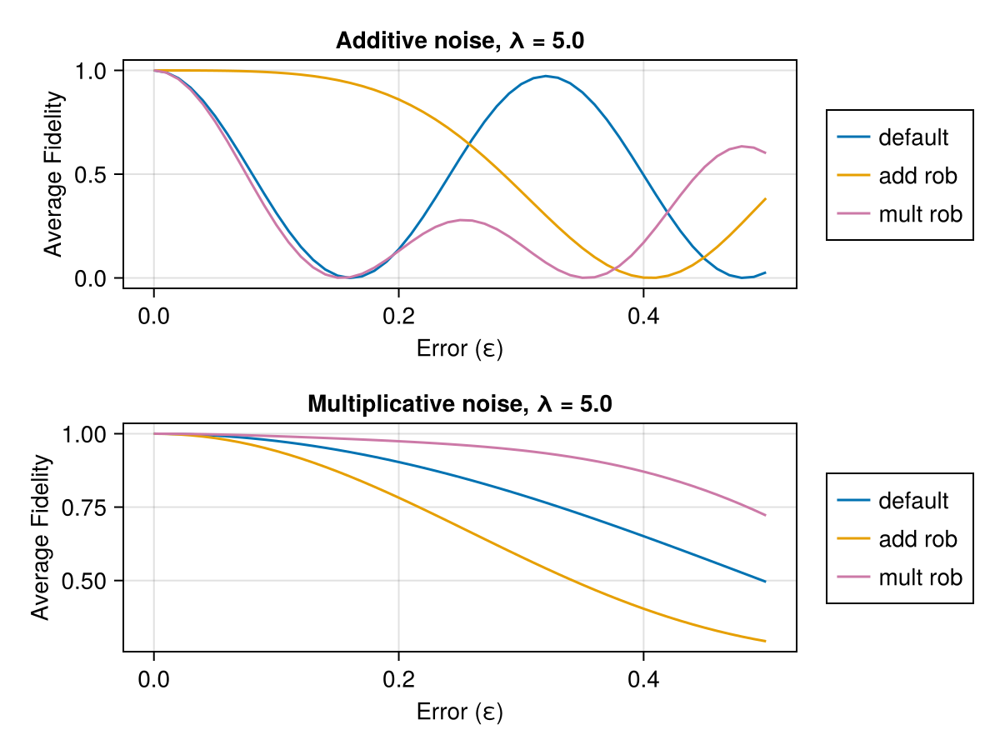

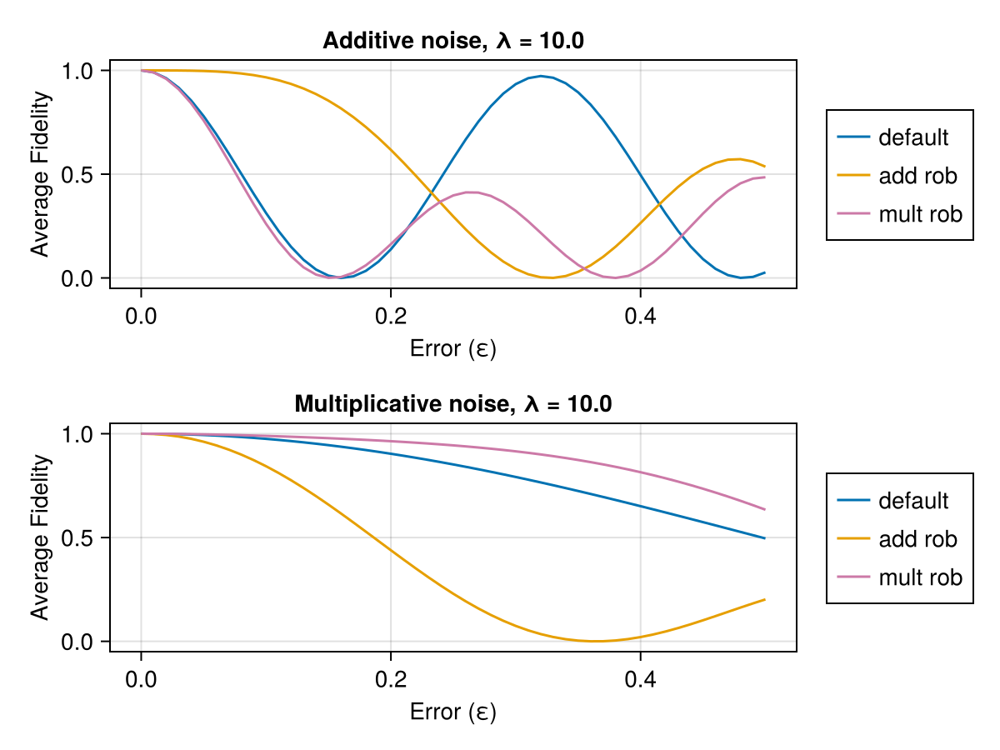

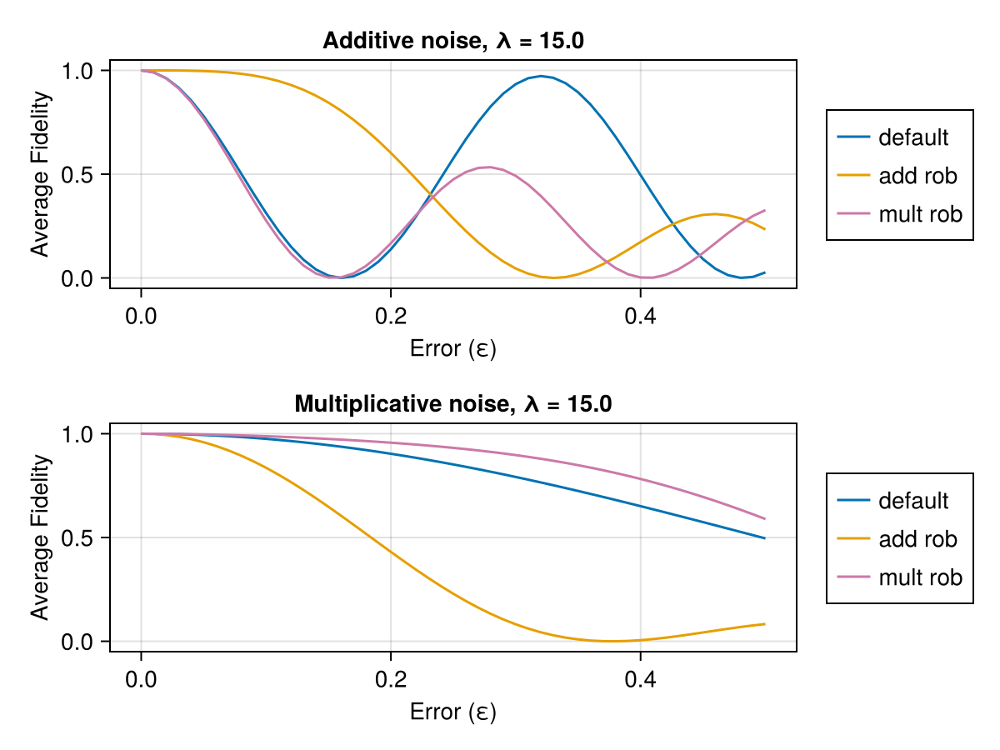

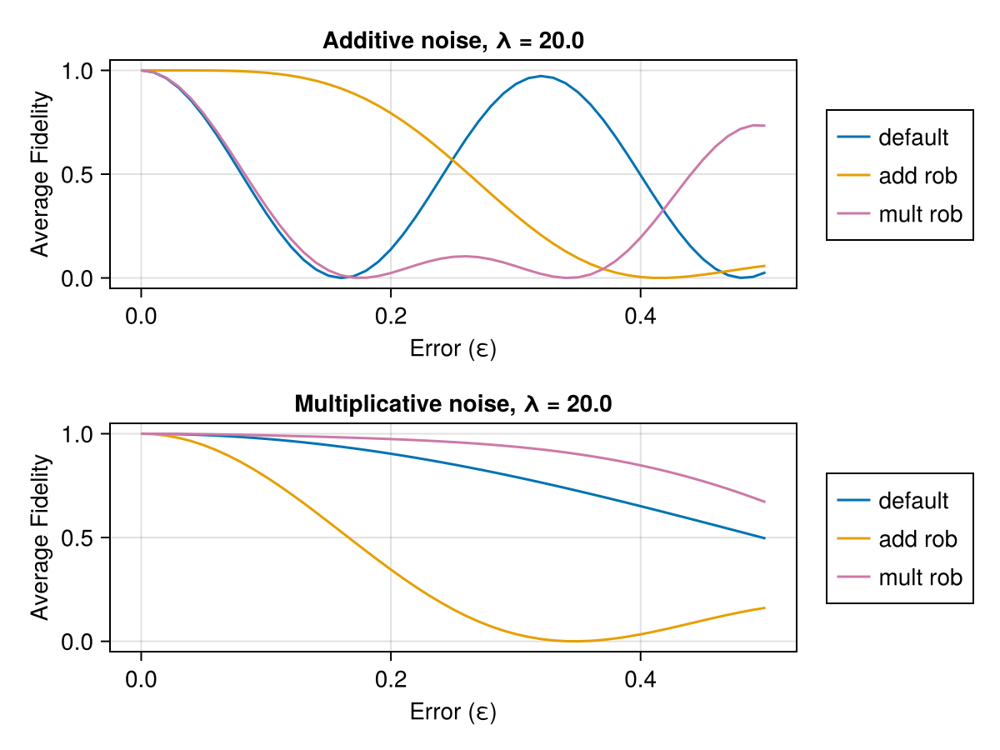

...

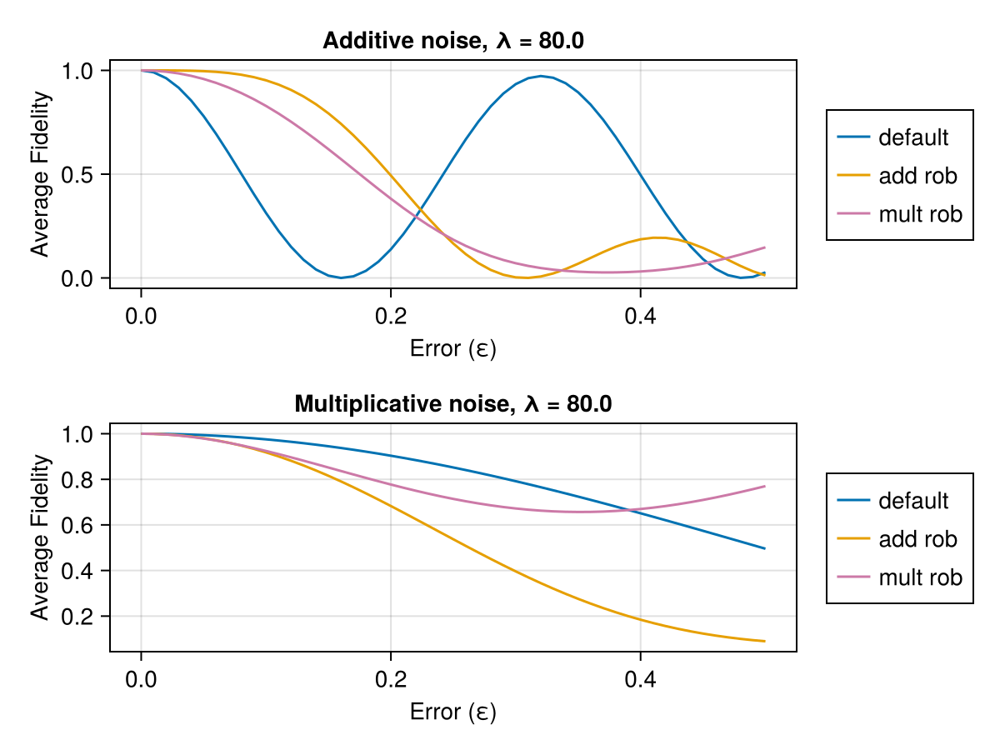

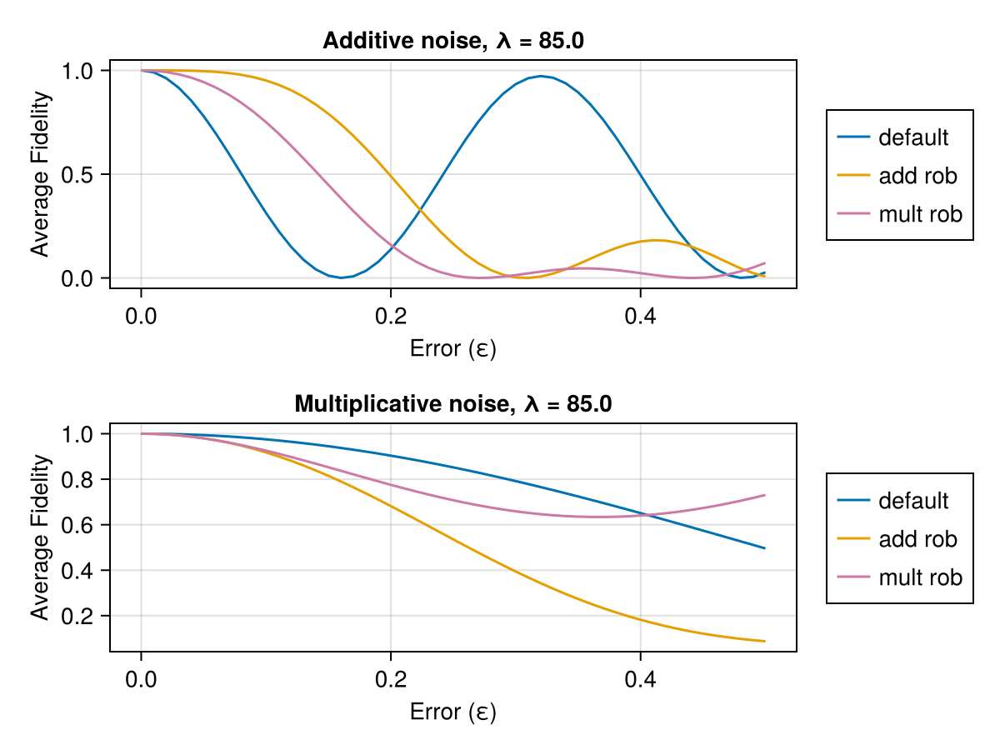

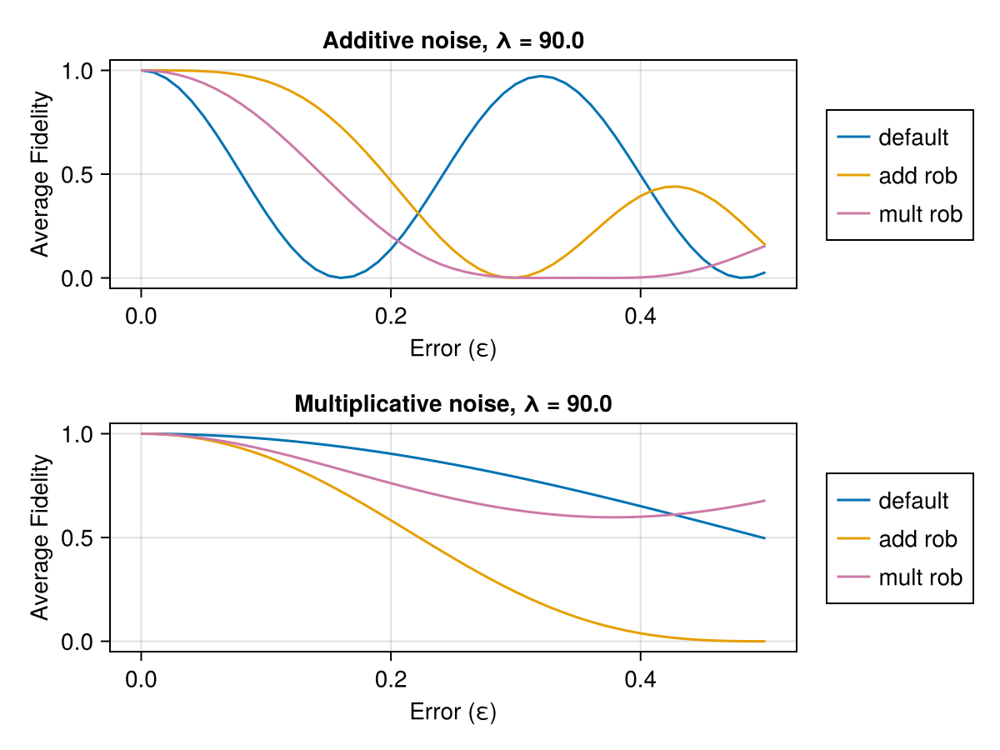

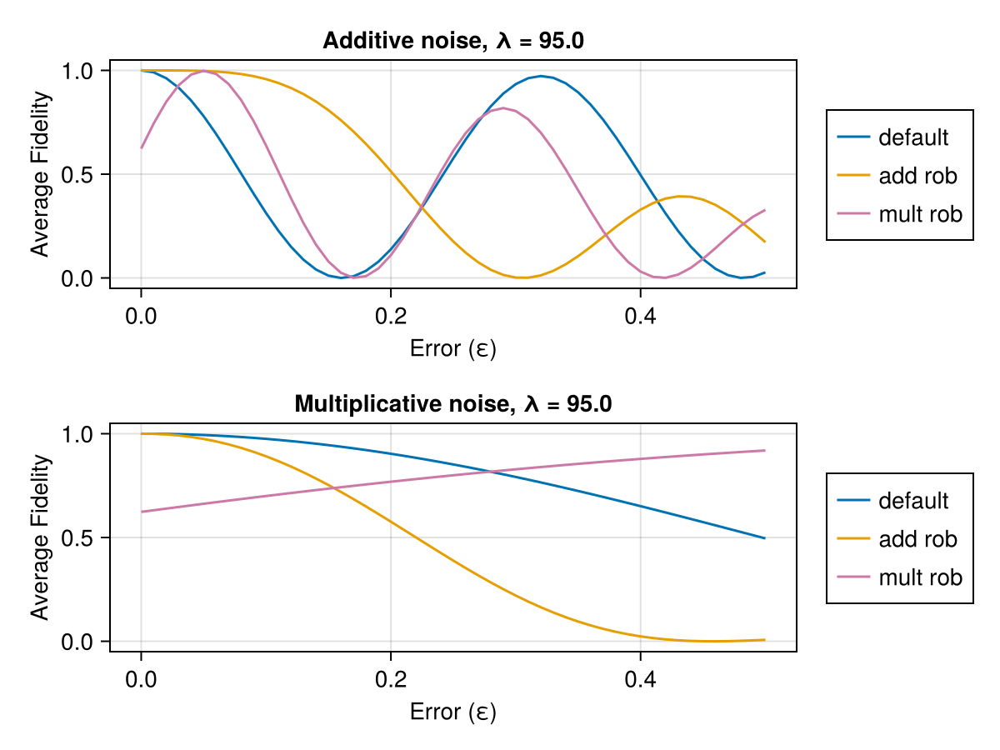

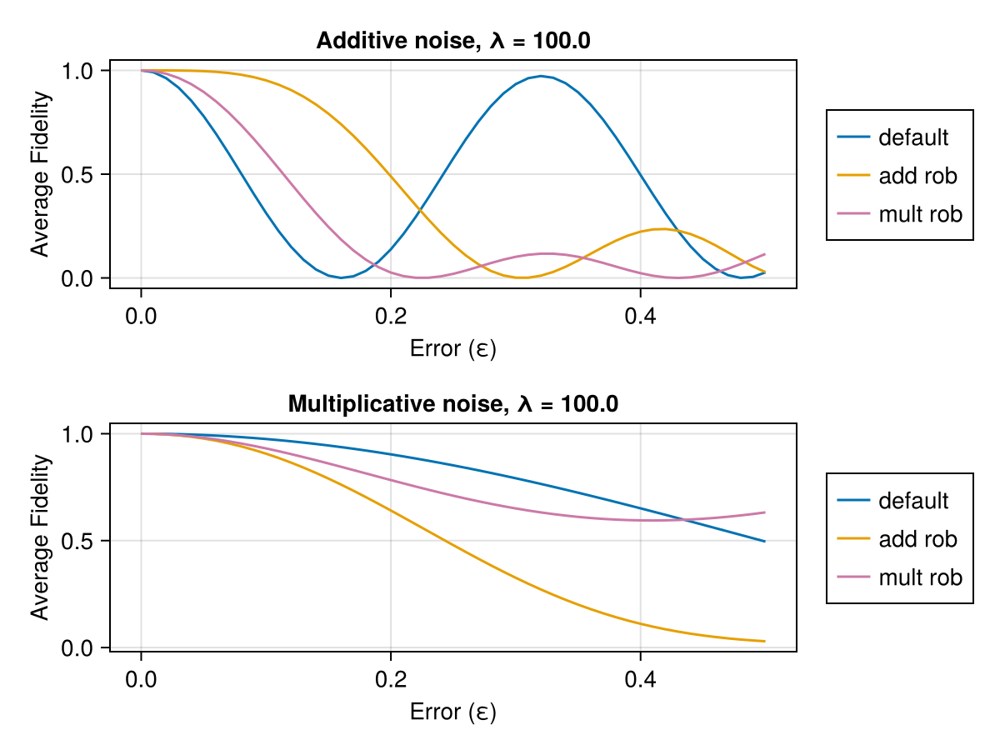

In [9]:
H_drive_add = H_drive
εs = 0:0.01:0.5
colors = Makie.wong_colors()

# Plot for each λ
for seed_idx in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        println("\nProcessing λ = $λ")
        f = Figure()
        ax1 = Axis(f[1, 1], title="Additive noise, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")
        ax2 = Axis(f[2, 1], title="Multiplicative noise, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")
        # ax3 = Axis(f[3, 1], title="Both noises, λ = $λ", xlabel="Error (ε)", ylabel="Average Fidelity")

        # Define system functions for additive and multiplicative noise
        additive_system = ε -> QuantumSystem(ε * PAULIS.X, H_drive)
        multiplicative_system = ε -> QuantumSystem((1 + ε) * H_drive)
        # both_system = ε -> QuantumSystem(ε * PAULIS.X, [(1 + ε) * H_drive])
        # Plot data structure: (matrix, label, color)
        plot_configs = [
            (default_probs, "default", colors[1]),
            (add_probs, "add rob", colors[2]),
            (mult_probs, "mult rob", colors[4])#,
            # (both_adj_probs, "both rob", colors[4])
        ]

        # Plot for both noise types
        for (probs_matrix, label, color) in plot_configs
            # Additive noise
            prob = probs_matrix[seed_idx, λ_idx]
            ys_add = [unitary_rollout_fidelity(prob.trajectory, QuantumSystem(ε * PAULIS.X, H_drive)) for ε in εs]
            lines!(ax1, εs, ys_add, label=label, color=color, linestyle=:solid)
            
            # Multiplicative noise
            ys_mult = [unitary_rollout_fidelity(prob.trajectory, QuantumSystem((1 + ε) * H_drive)) for ε in εs]
            lines!(ax2, εs, ys_mult, label=label, color=color, linestyle=:solid)
            
            # # Both noises
            # ys_both = [unitary_rollout_fidelity(prob.trajectory, QuantumSystem(ε * PAULIS.X, (1 + ε) * H_drive)) for ε in εs]
            # lines!(ax3, εs, ys_both, label=label, color=color, linestyle=:solid)
        end

        Legend(f[1, 2], ax1, position=:lb)
        Legend(f[2, 2], ax2, position=:lb)
        # Legend(f[3, 2], ax3, position=:lb)

        display(f)
    end
end


In [10]:
p1 = CairoMakie.plot(defaults.trajectory, [:a, :Ũ⃗])
p2 = CairoMakie.plot(add_prob.trajectory, [:a, :Ũ⃗])
p3 = CairoMakie.plot(mult_prob.trajectory, [:a, :Ũ⃗])
# p4 = CairoMakie.plot(both_prob.trajectory, [:a, :Ũ⃗])

display(p1)
display(p2)
display(p3)
# display(p4)

UndefVarError: UndefVarError: `defaults` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [11]:
Ũ⃗, Ũ⃗_vars = variational_unitary_rollout(add_prob.trajectory, varsys_mult);
QuantumObjectives.unitary_fidelity_loss(Ũ⃗[:, end], GATES.X) |> println

# Detailed results table
display("\n=== Detailed Results Table ===")
for seed_idx in 1:n_seeds
    display("\nseed idx = $seed_idx:")
    display("Weight λ | Base Fidelity | Add Fidelity | Mult Fidelity | Both")
    display("-" ^ 40)
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        def_fid = unitary_rollout_fidelity(tog_defaults[seed_idx, λ_idx].trajectory, sys)
        add_fid = unitary_rollout_fidelity(add_probs[seed_idx, λ_idx].trajectory, varsys_add)
        mult_fid = unitary_rollout_fidelity(add_probs[seed_idx, λ_idx].trajectory, varsys_mult)
        both_fid = unitary_rollout_fidelity(both_tog_probs[seed_idx, λ_idx].trajectory, varsys_both)
        display("$(lpad(round(λ, digits=4), 7)) | $(lpad(round(def_fid, digits=6), 12)) | $(lpad(round(add_fid, digits=6), 12)) | $(lpad(round(mult_fid, digits=6), 13)) | $(lpad(round(both_fid, digits=6), 12)) |")
    end
end


UndefVarError: UndefVarError: `add_prob` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

## Sensitivity Plots

### Robust

In [17]:
additive_fidelities = Matrix{Any}(undef, n_seeds, n_lambdas)
multiplicative_fidelities = Matrix{Any}(undef, n_seeds, n_lambdas)
for seed_idx in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        add_prob = add_probs[seed_idx, λ_idx]
        add_fid = unitary_rollout_fidelity(add_prob.trajectory, sys)
        additive_fidelities[seed_idx, λ_idx] = add_fid
        mult_prob = mult_probs[seed_idx, λ_idx]
        mult_fid = unitary_rollout_fidelity(mult_prob.trajectory, sys)
        multiplicative_fidelities[seed_idx, λ_idx] = mult_fid
    end
end

In [22]:
Hₑ_add = a -> PAULIS.X
X_drive = sys.H.H_drives[1]
Hₑ_mult = a -> a[1] * X_drive
      
additive_obj = Matrix{Any}(undef, n_seeds, n_lambdas)
multiplicative_obj = Matrix{Any}(undef, n_seeds, n_lambdas)

for seed_idx in 1:n_seeds
    for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        add_prob = add_probs[seed_idx, λ_idx]
        obj = FirstOrderObjective(Hₑ_add, add_prob.trajectory)
        Z_vec = vec(add_prob.trajectory)
        add_obj_val = obj.L(Z_vec)
        additive_obj[seed_idx, λ_idx] = add_obj_val

        mult_prob = mult_probs[seed_idx, λ_idx]
        obj = FirstOrderObjective(Hₑ_mult, mult_prob.trajectory)
        Z_vec = vec(mult_prob.trajectory)
        mult_obj_val = obj.L(Z_vec)
        multiplicative_obj[seed_idx, λ_idx] = mult_obj_val
    end
end

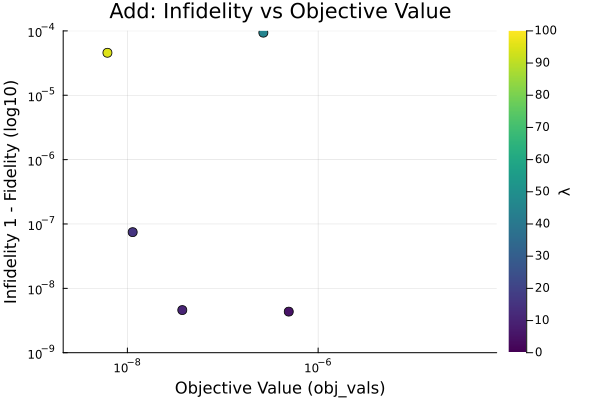

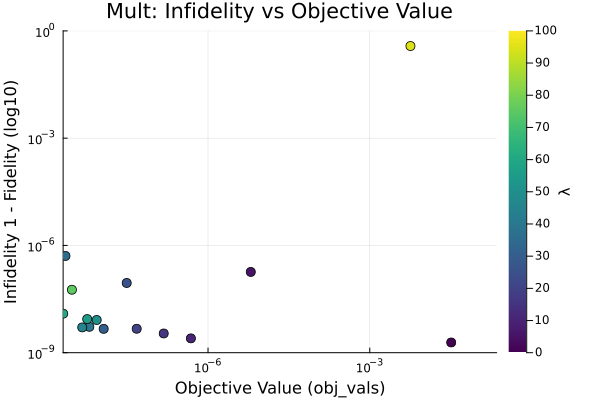

In [ ]:
to_infidelity(F::AbstractVector; floor_eps=1e-12) = max.(1 .- F, floor_eps)
julia_show_me_the_plots_please = []
titles = ["Add", "Mult"]
fids_by_cfg = [additive_fidelities, multiplicative_fidelities]
obj_by_cfg = [additive_obj, multiplicative_obj]

for (cfg_idx, title_name) in enumerate(titles)
    x_all = Float64[]
    y_all = Float64[]
    λ_all = Float64[]

    Ftbl = fids_by_cfg[cfg_idx]
    objs = obj_by_cfg[cfg_idx]
    for seed_idx in 1:n_seeds
        append!(x_all, objs[seed_idx, :])                         # x = obj_vals
        append!(y_all, to_infidelity(Ftbl[seed_idx, :]))          # y = infidelity
        append!(λ_all, sweep_rob_loss_λ)                          # color = λ
    end

    # Robust axis limits
    function log_axis_limits(x::AbstractVector; loq=0.01, hiq=0.98)
        xpos = filter(>(0), x)
        if isempty(xpos)
            return (1e-8, 1.0)
        end
        xlo = try quantile(xpos, loq) catch; minimum(xpos) end
        xhi = try quantile(xpos, hiq) catch; maximum(xpos) end
        xlo = max(xlo, minimum(xpos))
        xhi = max(xhi, nextfloat(xlo))
        (10.0 ^ floor(log10(xlo)), 10.0 ^ ceil(log10(xhi)))
    end

    xlo, xhi = log_axis_limits(x_all)
    ylo, yhi = log_axis_limits(y_all)

    p1 = Plots.scatter(
        x_all, y_all;
        zcolor = λ_all,
        color = :viridis,
        colorbar_title = "λ",
        colorbar = true,
        right_margin = 5mm,                # padding so colorbar doesn’t overlap
        xlabel = "Objective Value (obj_vals)",
        ylabel = "Infidelity 1 - Fidelity (log10)",
        title  = "$title_name: Infidelity vs Objective Value",
        xscale = :log10, yscale = :log10, # log scaling to handle wide range
        xlims = (xlo, xhi), ylims = (ylo, yhi),
        markersize = 5,
        grid = true, gridalpha = 0.3, gridcolor = :gray,
        legend = false,
    )
    p1 = Plots.plot(p1, colorbar_position = :right)

    # p1
    # push!(julia_show_me_the_plots_please, p)
    display(p1)
end

# display(julia_show_me_the_plots_please[1])
# julia_show_me_the_plots_please[2]
# display(julia_show_me_the_plots_please[2])


In [29]:
import Pkg; Pkg.add("CSV")

In [39]:
using CSV
obj_vals = zeros(n_seeds, n_lambdas)
Hₑ_add = a -> PAULIS.X
X_drive = sys.H.H_drives[1]
Hₑ_mult = a -> a[1] * X_drive

# fidelity storages per noise model
additive_fidelities       = zeros(n_seeds, n_lambdas)
multiplicative_fidelities = zeros(n_seeds, n_lambdas)

# Helper: safe infidelity for log plots
to_infidelity(F::AbstractVector; floor_eps=1e-12) = max.(1 .- F, floor_eps)

# Compute obj_vals and fidelities
configs = [
    (add_probs,  additive_fidelities,       Hₑ_add),
    (mult_probs, multiplicative_fidelities, Hₑ_mult)
]
titles = ["Add", "Mult"]

for (probs, fidelities, Hₑ) in configs
    println("----------------! New noise model !----------------")
    for seed_idx in 1:n_seeds
        for (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
            prob = probs[seed_idx, λ_idx]
            println("\nProcessing λ = $λ")

            obj = QuantumObjectives.FirstOrderObjective(Hₑ, prob.trajectory; Q_t=λ)

            Z_vec = vec(prob.trajectory)
            obj_vals[seed_idx, λ_idx] = (λ > 0 ? obj.L(Z_vec)/λ : NaN)

            # Robust rollout fidelity (against nominal system unless you want otherwise)
            fidelities[seed_idx, λ_idx] = unitary_rollout_fidelity(prob.trajectory, sys)
        end
    end
end

results = DataFrame(Seed=Int[], λ=Float64[], NoiseModel=String[],
                    ObjectiveValue=Float64[], Fidelity=Float64[])

for (cfg_idx, title_name) in enumerate(titles)
    Ftbl = (cfg_idx == 1) ? additive_fidelities : multiplicative_fidelities
    for seed_idx in 1:n_seeds, (λ_idx, λ) in enumerate(sweep_rob_loss_λ)
        push!(results, (
            seed_idx,
            λ,
            title_name,
            obj_vals[seed_idx, λ_idx],
            Ftbl[seed_idx, λ_idx],
        ))
    end
end

# Save the table (optional)
CSV.write("fidelity_vs_objective.csv", results)

# Show first rows inline
first(results, 20) |> display

Row,Seed,λ,NoiseModel,ObjectiveValue,Fidelity
,Int64,Float64,String,Float64,Float64
1,1,0.0,Add,NaN,1.0
2,1,5.0,Add,6.20877e-6,1.0
3,1,10.0,Add,4.81012e-7,1.0
4,1,15.0,Add,1.50686e-7,1.0
5,1,20.0,Add,4.75226e-8,1.0
6,1,25.0,Add,3.1017e-8,1.0
7,1,30.0,Add,1.16002e-8,1.0
8,1,35.0,Add,2.26775e-9,1.0
9,1,40.0,Add,6.28661e-9,1.0


In [43]:

########################
##  Plotting (λ color)##
########################
julia_show_me_the_plots_please = []

fids_by_cfg = [additive_fidelities, multiplicative_fidelities]

for (cfg_idx, title_name) in enumerate(titles)
    x_all = Float64[]
    y_all = Float64[]
    λ_all = Float64[]

    Ftbl = fids_by_cfg[cfg_idx]

    for seed_idx in 1:n_seeds
        append!(x_all, obj_vals[seed_idx, :])             # x = objective value
        append!(y_all, to_infidelity(Ftbl[seed_idx, :]))  # y = 1 - fidelity
        append!(λ_all, sweep_rob_loss_λ)                  # color = λ
    end

    # Filter for log scales & finite values
    good = isfinite.(x_all) .& isfinite.(y_all) .& (x_all .> 0) .& (y_all .> 0)
    x = x_all[good]; y = y_all[good]; λc = λ_all[good]

    # Log limits from data
    xmin, xmax = minimum(x), maximum(x)
    ymin, ymax = minimum(y), maximum(y)
    xlims = (10.0^floor(log10(xmin)), 10.0^ceil(log10(xmax)))
    ylims = (10.0^floor(log10(ymin)), 10.0^ceil(log10(ymax)))

    p2 = Plots.scatter(
        x, y;
        zcolor = λc, color = :viridis,
        colorbar = true, colorbar_title = "λ", colorbar_position = :right,
        right_margin = 20,  # pixels; avoids importing Measures.mm
        xlabel = "Objective value (obj_vals)",
        ylabel = "Infidelity 1 - Fidelity (log)",
        title  = "$title_name: Infidelity vs Objective",
        xscale = :log10, yscale = :log10,
        xlims = xlims, ylims = ylims,
        markersize = 5,
        grid = true, gridalpha = 0.3, gridcolor = :gray,
        legend = false,
    )
    # push!(panels, p)
    p = Plots.plot(p2, colorbar_position = :right)
    push!(julia_show_me_the_plots_please, p)
    p
    show(p)
end

display(julia_show_me_the_plots_please[1])
julia_show_me_the_plots_please[2]
display(julia_show_me_the_plots_please[2])
